In [12]:
import networkx as nx
import osmnx as ox
from shapely.geometry import LineString, mapping
import geopandas as gpd
from ipyleaflet import *
from ipyleaflet import Map
from ipywidgets import Widget

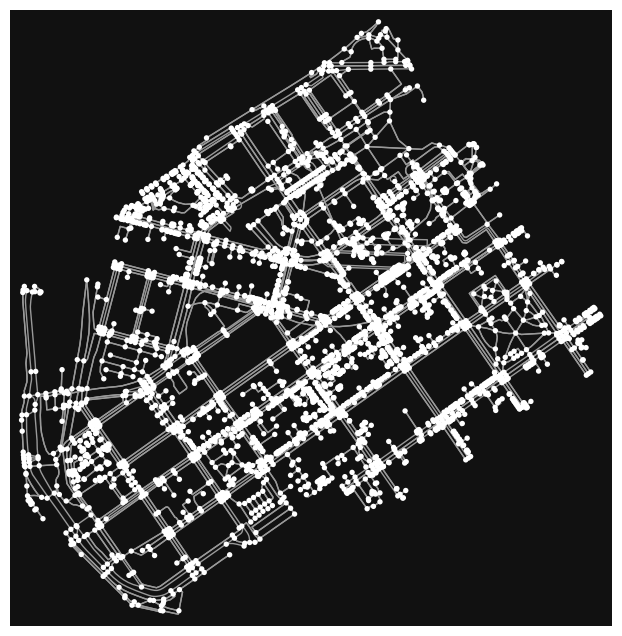

In [2]:
place_name = "Kamppi, Helsinki, Finland"
graph = ox.graph_from_place(place_name)
fig, ax = ox.plot_graph(graph)

In [3]:
nodes, edges = ox.graph_to_gdfs(graph)
nodes

,y,x,street_count,railway,highway,ref,geometry
osmid,,,,,,,
25216594,60.164794,24.921057,5,NaN,NaN,NaN,POINT (24.92106 60.16479)
25238874,60.163663,24.921029,4,tram_level_crossing,NaN,NaN,POINT (24.92103 60.16366)
25238883,60.163452,24.921441,4,NaN,crossing,NaN,POINT (24.92144 60.16345)
25238933,60.161114,24.924529,3,NaN,NaN,NaN,POINT (24.92453 60.16111)
25238937,60.160860,24.925861,3,NaN,NaN,NaN,POINT (24.92586 60.16086)
...,...,...,...,...,...,...,...
12321081627,60.166783,24.920807,3,NaN,NaN,NaN,POINT (24.92081 60.16678)
12374873000,60.169577,24.938351,3,NaN,NaN,NaN,POINT (24.93835 60.16958)
12374876701,60.169640,24.938257,3,NaN,NaN,NaN,POINT (24.93826 60.16964)


In [4]:
center = (60.16607, 24.93116)
m = Map(center=center, basemap=basemaps.CartoDB.Positron, zoom=15)
m

Map(center=[60.16607, 24.93116], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', '…

In [5]:
#style for the destination marker
to_marker_style = AwesomeIcon(
    name='circle',
    icon_color='white',
    marker_color='red',
    spin=False
)
from_marker = Marker(location=center)
to_marker = Marker(location=center, icon=to_marker_style)

In [6]:
# def set_nearest_node(marker):
#  marker.nearest_node = ox.get_nearest_node(graph, marker.location)
#  return

def set_nearest_node(marker):
    marker.nearest_node = ox.distance.nearest_nodes(graph, marker.location[1], marker.location[0])
    return


In [7]:
path_layer_list = []
def handle_change_location(event, marker):
    event_owner = event['owner']
    event_owner.nearest_node = ox.get_nearest_node(graph, event_owner.location)
    marker.nearest_node = ox.get_nearest_node(graph, marker.location)
    
    shortest_path = nx.dijkstra_path(graph, event_owner.nearest_node, marker.nearest_node, 
                                     weight='length')
    
    if len(path_layer_list) == 1:
        m.remove_layer(path_layer_list[0])
        path_layer_list.pop()
    
    shortest_path_points = nodes.loc[shortest_path]
    path = gpd.GeoDataFrame([LineString(shortest_path_points.geometry.values)], columns=['geometry'])
    path_layer = GeoData(geo_dataframe=path, style={'color':'black', 'weight':2})
    m.add_layer(path_layer)
    path_layer_list.append(path_layer)

In [8]:
from_marker.observe(lambda event: handle_change_location(event, to_marker), 'location')
to_marker.observe(lambda event: handle_change_location(event, from_marker), 'location')

In [9]:
m.add_layer(from_marker)
m.add_layer(to_marker)
set_nearest_node(from_marker)
set_nearest_node(to_marker)
m

Map(center=[60.16607, 24.93116], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', '…

In [11]:
import ipyleaflet
import ipywidgets
print("ipyleaflet:", ipyleaflet.__version__)
print("ipywidgets:", ipywidgets.__version__)


ipyleaflet: 0.19.2
ipywidgets: 8.1.5


# youtube

In [1]:
import osmnx as ox

road = ox.graph_from_place('Chennai, India', network_type="drive")

prj_road = ox.project_graph(road)

ox.save_graph_shapefile(prj_road, filepath=r'C:/Users/Hermela\Documents/Map-Routing-Problem')

AttributeError: module 'osmnx' has no attribute 'save_graph_shapefile'

In [2]:
# import osmnx as ox

# G = ox.graph_from_place('Venice', network_type='drive')

# ox.plot_graph_folium(G, tiles='openstreetmap', weight=1)

import osmnx as ox
import folium

# Create a graph from a place
G = ox.graph_from_place('Venice', network_type='drive')

# Get the nodes and edges for plotting
nodes, edges = ox.graph_to_gdfs(G)

# Create a map centered around Venice
m = folium.Map(location=[nodes['y'].mean(), nodes['x'].mean()], zoom_start=13)

# Add the edges to the map
for _, data in edges.iterrows():
    # Extract coordinates from the edge geometry
    coords = list(zip(data['geometry'].coords))
    # Create a line for each edge
    folium.PolyLine(coords, color='blue', weight=1).add_to(m)

# Display the map
m


In [5]:
# shortest_path = ox.shortest_path(G, 1543462921, 10653280616, weight='length')

# ox.plot_route_folium(G,
#                      shortest_path,
#                      tiles='openstreetmap')

import osmnx as ox
import folium

# Create a graph from a place (e.g., Venice)
G = ox.graph_from_place('Venice', network_type='drive')

# Get nodes and edges
nodes, edges = ox.graph_to_gdfs(G)

# Find the shortest path (example with arbitrary nodes)
shortest_path = ox.shortest_path(G, 1543462921, 10653280616, weight='length')

# Get the coordinates of the shortest path
route_coords = [(G.nodes[node]['y'], G.nodes[node]['x']) for node in shortest_path]

# Create a folium map centered around the mean location of the nodes
m = folium.Map(location=[nodes['y'].mean(), nodes['x'].mean()], zoom_start=13)

# Add the route to the map using PolyLine
folium.PolyLine(locations=route_coords, color='blue', weight=5).add_to(m)

# Display the map
m
